In [8]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

from collections import Counter
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

In [7]:
#Imbalanced dataset
X,y = make_classification(n_samples=10000,
                          n_features=2,
                          n_redundant=0, #no redundant meaning linear combination
                          n_clusters_per_class=1,weights=[0.99], #class imbalance: ~99% of samples belong to class 0, ~1% to class 1.
                          random_state=10)

In [5]:
Counter(y)

Counter({0: 9846, 1: 154})

<Axes: xlabel='0', ylabel='1'>

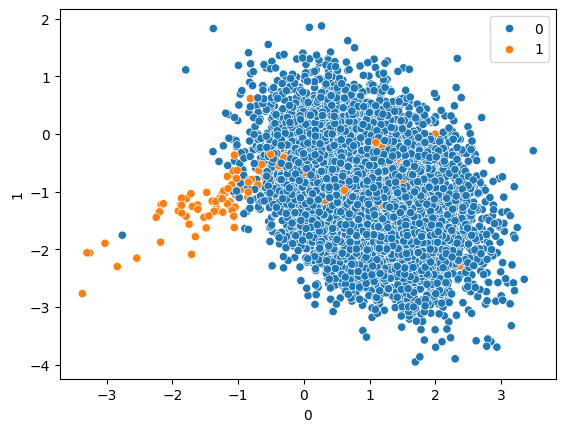

In [11]:
sns.scatterplot(x=pd.DataFrame(X)[0],y=pd.DataFrame(X)[1],hue=y)

In [12]:
#train test split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=0)

In [24]:
#Hyperparamter tuning
model=LogisticRegression()
penalty=['l1','l2','elasticnet']
c_values=[100,10,1.0,0.1,0.01]
solver=['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']
class_weight=[{0:w,1:y} for w in [1,10,50,100] for y in [1,10,50,100]]

# Define parameter grid in your style
params = [
    # l1 penalty → only liblinear or saga
    dict(penalty=['l1'],
         C=[100, 10, 1.0, 0.1, 0.01],
         solver=['liblinear', 'saga'],
         class_weight=[{0:w,1:y} for w in [1,10,50,100] for y in [1,10,50,100]]),

    # l2 penalty → works with all solvers
    dict(penalty=['l2'],
         C=[100, 10, 1.0, 0.1, 0.01],
         solver=['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
         class_weight=[{0:w,1:y} for w in [1,10,50,100] for y in [1,10,50,100]]),

    # elasticnet penalty → only saga
    dict(penalty=['elasticnet'],
         C=[100, 10, 1.0, 0.1, 0.01],
         solver=['saga'],
         l1_ratio=[0.5, 0.7, 0.9],
         class_weight=[{0:w,1:y} for w in [1,10,50,100] for y in [1,10,50,100]])
]

In [25]:
#GridStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedGroupKFold

cv=StratifiedGroupKFold(n_splits= 5,shuffle = True,random_state = 0)
grid=GridSearchCV(estimator=model,param_grid=params,scoring='accuracy',cv=cv)

print('CV :', cv)
print('Grid :', grid)

CV : StratifiedGroupKFold(n_splits=5, random_state=0, shuffle=True)
Grid : GridSearchCV(cv=StratifiedGroupKFold(n_splits=5, random_state=0, shuffle=True),
             estimator=LogisticRegression(),
             param_grid=[{'C': [100, 10, 1.0, 0.1, 0.01],
                          'class_weight': [{0: 1, 1: 1}, {0: 1, 1: 10},
                                           {0: 1, 1: 50}, {0: 1, 1: 100},
                                           {0: 10, 1: 1}, {0: 10, 1: 10},
                                           {0: 10, 1: 50}, {0: 10, 1: 100},
                                           {0: 50, 1: 1}, {0: 50, 1: 10},
                                           {0: 50, 1: 50}, {0: 50, 1: 100},
                                           {0: 100, 1: 1}, {0: 100, 1: 10},
                                           {0: 100, 1: 50}, {0: 100, 1:...
                                     'newton-cholesky', 'sag', 'saga']},
                         {'C': [100, 10, 1.0, 0.1, 0.01],
              

In [26]:
grid.fit(X_train,y_train)

c:\Users\TABARAK\Downloads\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\TABARAK\Downloads\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\TABARAK\Downloads\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\TABARAK\Downloads\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 371, in _score
    y_pred = method_caller(
             ^^^^^^^^^^^^^^
  File "c:\Users\TABARAK\Downloads\anaconda3\

GridSearchCV(cv=StratifiedGroupKFold(n_splits=5, random_state=0, shuffle=True),
             estimator=LogisticRegression(),
             param_grid=[{'C': [100, 10, 1.0, 0.1, 0.01],
                          'class_weight': [{0: 1, 1: 1}, {0: 1, 1: 10},
                                           {0: 1, 1: 50}, {0: 1, 1: 100},
                                           {0: 10, 1: 1}, {0: 10, 1: 10},
                                           {0: 10, 1: 50}, {0: 10, 1: 100},
                                           {0: 50, 1: 1}, {0: 50, 1: 10},
                                           {0: 50, 1: 50}, {0: 50, 1: 100},
                                           {0: 100, 1: 1}, {0: 100, 1: 10},
                                           {0: 100, 1: 50}, {0: 100, 1:...
                                     'newton-cholesky', 'sag', 'saga']},
                         {'C': [100, 10, 1.0, 0.1, 0.01],
                          'class_weight': [{0: 1, 1: 1}, {0: 1, 1: 10},
                                           {0: 1, 1: 50}, {0: 1, 1: 100},
                                           {0: 10, 1: 1}, {0: 10, 1: 10},
                                           {0: 10, 1: 50}, {0: 10, 1: 100},
                                           {0: 50, 1: 1}, {0: 50, 1: 10},
                                           {0: 50, 1: 50}, {0: 50, 1: 100},
                                           {0: 100, 1: 1}, {0: 100, 1: 10},
                                           {0: 100, 1: 50}, {0: 100, 1: 100}],
                          'l1_ratio': [0.5, 0.7, 0.9],
                          'penalty': ['elasticnet'], 'solver': ['saga']}],
             scoring='accuracy')

In [27]:
grid.best_params_

{'C': 100,
 'class_weight': {0: 1, 1: 1},
 'penalty': 'l1',
 'solver': 'liblinear'}

In [30]:
y_pred=grid.predict(X_test)

In [32]:
#METRICS
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

score=accuracy_score(y_pred,y_test)
cm=confusion_matrix(y_test,y_pred)
cr=classification_report(y_test,y_pred)
print(score)
print(cm)
print(cr)

#This has accuracy 98% buit its misleading as it has on good accuracy and other as bad

0.9888
[[2469    1]
 [  27    3]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2470
           1       0.75      0.10      0.18        30

    accuracy                           0.99      2500
   macro avg       0.87      0.55      0.59      2500
weighted avg       0.99      0.99      0.98      2500

